<a href="https://colab.research.google.com/github/danielleitesoares/tccuea/blob/main/TCC_Queimadas_Biomas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <center>Universidade do Estado do Amazonas</center>
##### <center>Pós-graduação Lato Sensu em Ciência de Dados</center>
##### <center>Fundamentos de Machine Learning Aplicado II (Turma 02)</center>

<center>

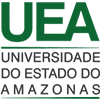

</center>

---

## <center>Código fonte do TCC</center>
##### <center>**Professora:** Msc. Alice Adativa</center>
###### <center>**Aluno:** Daniel Erasmo Leite Soares</center>



---



## **<center>Análise histórica e clusterização de focos de Queimadas nos Biomas Brasileiros** </center>

### **<center>Dados Coletados e Geridos pelo INPE.** </center>

<center>O monitoramento de queimadas e incêndios florestais em imagens de satélites é particularmente útil para regiões remotas sem meios intensivos e locais de acompanhamento, condição esta que representa a situação geral do País. Para uma área com torres de observação guarnecidas continuamente e mantendo comunicação direta com brigadas de combate de fogo, os dados de satélite têm interesse marginal. 
A detecção dos focos de queima de vegetação nas imagens utiliza um mesmo modo de identificação de fogo, em todas regiões, todos os dias e por anos seguidos, o que permite análises temporais e espaciais da ocorrência do fogo que seriam impossíveis de outra forma, dada a precariedade, descontinuidade e diferença de métodos nas fontes de informação locais.  Em particular, os dados do "satélite de referência" permitem a comparação entre qualquer país do Planeta.</center>



[Dados disponíveis aqui.](https://queimadas.dgi.inpe.br/queimadas/bdqueimadas)




## <center>Os dados são coletados por uma constelação de satélites.</center>

[Representação artística em tempo real](http://stuffin.space/)


## **<center>Os Biomas Brasileiros** </center>


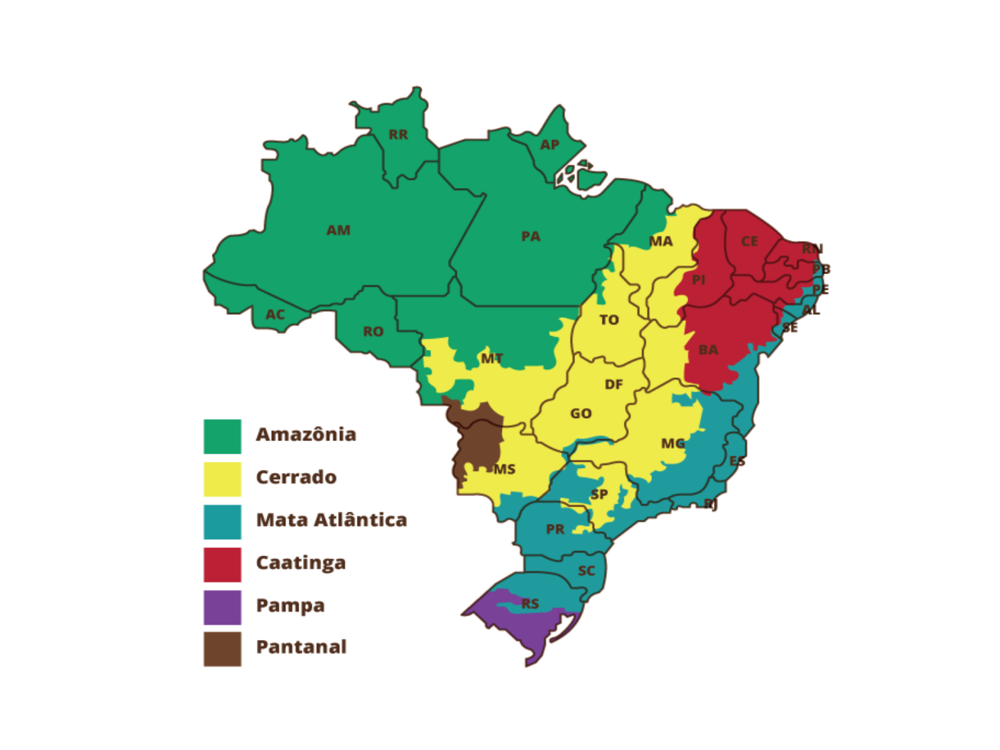



## Preparação do Ambiente

---



In [1]:
# Pacotes instalados
# !pip install geopandas
# !pip install contextily
# !pip install biokit
# !pip install plotly

In [2]:
## Bibliotecas de Tratamento de Dados
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import contextily
import numpy as np

## Bibliotecas Gráficas
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go

## Bibliotecas de ML
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
#from sklearn.cluster import MeanShift
#from sklearn.cluster import estimate_bandwidth

ModuleNotFoundError: ignored

## Carregamento e preparação do DataFrame de todos os Biomas

---



In [ ]:
# Montando a pasta do Drive
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# # Criando os DataFrames de focos de queimadas do Brasil
# alertas_2019 = pd.read_csv('/content/drive/MyDrive/TCC/dataset/novos/Focos_2019-01-01_2019-12-31.csv')
# alertas_2020 = pd.read_csv('/content/drive/MyDrive/TCC/dataset/novos/Focos_2020-01-01_2020-12-31.csv')
# alertas_2021 = pd.read_csv('/content/drive/MyDrive/TCC/dataset/novos/Focos_2021-01-01_2021-12-31.csv')
# alertas = [alertas_2019, alertas_2020, alertas_2021]
# alertas_1921 = pd.concat(alertas)

In [ ]:
# Criando os DataFrames de focos de queimadas do Brasil
alertas_2019 = pd.read_csv('https://raw.githubusercontent.com/danielleitesoares/tccuea/main/Focos_2019-01-01_2019-12-31.csv?token=GHSAT0AAAAAABQH6R4EKBICKGFSG4G4WTWCYSPLQQA')
alertas_2020 = pd.read_csv('https://raw.githubusercontent.com/danielleitesoares/tccuea/main/Focos_2020-01-01_2020-12-31.csv?token=GHSAT0AAAAAABQH6R4FGLNC5CU5CFLRF3IOYSPLRTA')
alertas_2021 = pd.read_csv('https://raw.githubusercontent.com/danielleitesoares/tccuea/main/Focos_2021-01-01_2021-12-31.csv?token=GHSAT0AAAAAABQH6R4EX5LMOLUA3FOFMDROYSPLSEQ')
alertas = [alertas_2019, alertas_2020, alertas_2021]
alertas_1921 = pd.concat(alertas)

In [ ]:
alertas_1921

,datahora,satelite,pais,estado,municipio,bioma,diasemchuva,precipitacao,riscofogo,latitude,longitude,frp
0,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,PACAJA,Amazonia,2.0,1.6,0.5,-3.60200,-49.96300,201.6
1,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.63000,-52.25500,47.5
2,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.63100,-52.26400,17.4
3,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.64200,-52.26500,12.4
4,2019/10/27 17:05:00,AQUA_M-T,Brasil,AMAZONAS,NOVA OLINDA DO NORTE,Amazonia,0.0,0.3,0.0,-3.65100,-58.25400,12.1
...,...,...,...,...,...,...,...,...,...,...,...,...
184076,2021/08/29 17:05:00,AQUA_M-T,Brasil,TOCANTINS,LAGOA DA CONFUSAO,Cerrado,88.0,0.0,1.0,-10.87773,-50.33506,246.6
184077,2021/08/29 17:05:00,AQUA_M-T,Brasil,MATO GROSSO,NOVO SANTO ANTONIO,Cerrado,104.0,0.0,1.0,-12.37030,-51.13305,10.4
184078,2021/08/29 17:05:00,AQUA_M-T,Brasil,MATO GROSSO,NOVO SANTO ANTONIO,Cerrado,103.0,0.0,1.0,-12.34445,-51.14636,150.6
184079,2021/08/29 17:07:00,AQUA_M-T,Brasil,PARA,PACAJA,Amazonia,2.0,0.0,0.5,-4.08141,-50.88046,19.3


In [ ]:
geometry = [Point(xy) for xy in zip(alertas_1921['longitude'], alertas_1921['latitude'])]

In [ ]:
alertas_1921 = gpd.GeoDataFrame(alertas_1921, crs='EPSG:4326', geometry=geometry)

In [ ]:
type(alertas_1921)

geopandas.geodataframe.GeoDataFrame

In [ ]:
alertas_1921

,datahora,satelite,pais,estado,municipio,bioma,diasemchuva,precipitacao,riscofogo,latitude,longitude,frp,geometry
0,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,PACAJA,Amazonia,2.0,1.6,0.5,-3.60200,-49.96300,201.6,POINT (-49.96300 -3.60200)
1,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.63000,-52.25500,47.5,POINT (-52.25500 -3.63000)
2,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.63100,-52.26400,17.4,POINT (-52.26400 -3.63100)
3,2019/10/27 17:05:00,AQUA_M-T,Brasil,PARA,ALTAMIRA,Amazonia,0.0,0.5,0.2,-3.64200,-52.26500,12.4,POINT (-52.26500 -3.64200)
4,2019/10/27 17:05:00,AQUA_M-T,Brasil,AMAZONAS,NOVA OLINDA DO NORTE,Amazonia,0.0,0.3,0.0,-3.65100,-58.25400,12.1,POINT (-58.25400 -3.65100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
184076,2021/08/29 17:05:00,AQUA_M-T,Brasil,TOCANTINS,LAGOA DA CONFUSAO,Cerrado,88.0,0.0,1.0,-10.87773,-50.33506,246.6,POINT (-50.33506 -10.87773)
184077,2021/08/29 17:05:00,AQUA_M-T,Brasil,MATO GROSSO,NOVO SANTO ANTONIO,Cerrado,104.0,0.0,1.0,-12.37030,-51.13305,10.4,POINT (-51.13305 -12.37030)
184078,2021/08/29 17:05:00,AQUA_M-T,Brasil,MATO GROSSO,NOVO SANTO ANTONIO,Cerrado,103.0,0.0,1.0,-12.34445,-51.14636,150.6,POINT (-51.14636 -12.34445)
184079,2021/08/29 17:07:00,AQUA_M-T,Brasil,PARA,PACAJA,Amazonia,2.0,0.0,0.5,-4.08141,-50.88046,19.3,POINT (-50.88046 -4.08141)


In [ ]:
alertas_1921 = alertas_1921.to_crs(crs='EPSG:3857')

In [ ]:
alertas_1921.crs.to_string()

'EPSG:3857'

In [ ]:
alertas_1921['bioma'].unique()

array(['Amazonia', 'Pantanal', 'Cerrado', 'Caatinga', 'Mata Atlantica',
       'Pampa'], dtype=object)

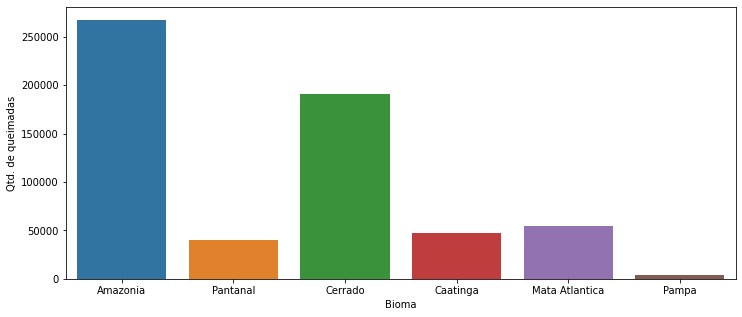

In [ ]:
plt.figure(figsize=(12,5))
ax = sns.countplot(x='bioma', data=alertas_1921)
ax.set_xlabel('Bioma')
ax.set_ylabel('Qtd. de queimadas')
plt.show()

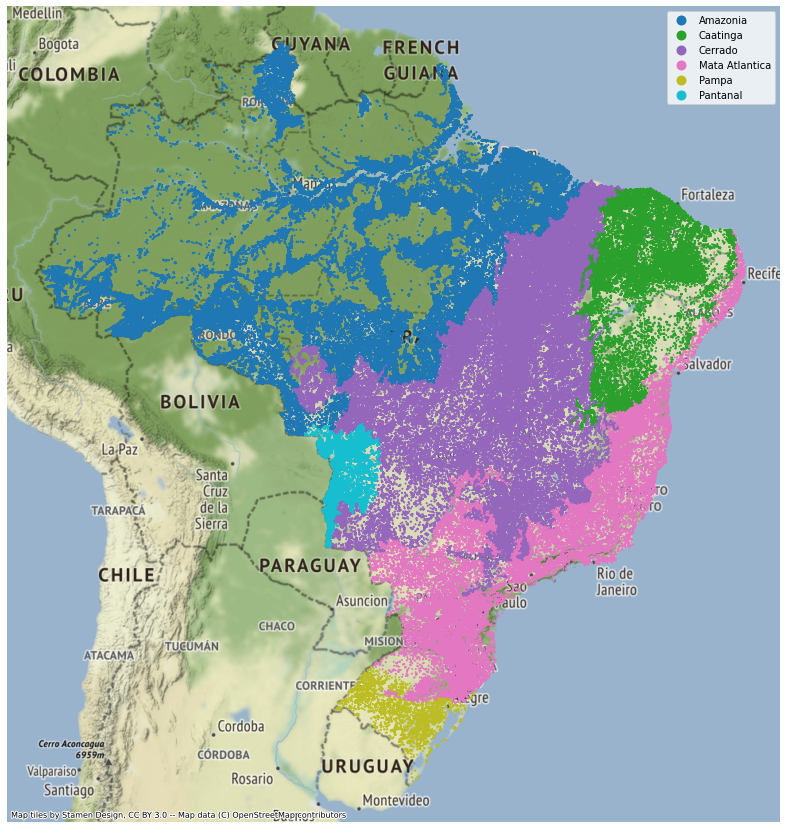

In [ ]:
ax = alertas_1921.plot(figsize=(20, 15), column='bioma', markersize=1, legend=True)
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

**DataFrame Pré-Processado**

In [ ]:
coord_biomas = alertas_1921.drop(columns=["datahora","satelite","pais","estado","municipio","bioma","diasemchuva","precipitacao","riscofogo","frp","geometry"])
#coord_biomas = alertas_1921.drop(columns=["datahora","satelite","pais","estado","municipio","diasemchuva","precipitacao","riscofogo","frp","geometry"])

In [ ]:
coord_biomas

,latitude,longitude
0,-3.60200,-49.96300
1,-3.63000,-52.25500
2,-3.63100,-52.26400
3,-3.64200,-52.26500
4,-3.65100,-58.25400
...,...,...
184076,-10.87773,-50.33506
184077,-12.37030,-51.13305
184078,-12.34445,-51.14636
184079,-4.08141,-50.88046


## **Aplicação dos Algoritmos para os Biomas**


*   K-Means
*   DBSCAN

**Salvando o Dataframe para os Biomas**

In [ ]:
coord_biomas.to_csv(r'/content/coord_biomas.csv', encoding = 'utf-8', sep =';', header=True, index=True) 

**K-Means Para os Biomas**

In [ ]:
coord_biomas

,latitude,longitude
0,-3.60200,-49.96300
1,-3.63000,-52.25500
2,-3.63100,-52.26400
3,-3.64200,-52.26500
4,-3.65100,-58.25400
...,...,...
184076,-10.87773,-50.33506
184077,-12.37030,-51.13305
184078,-12.34445,-51.14636
184079,-4.08141,-50.88046


In [ ]:
agrupadorK = KMeans(n_clusters=6)

In [ ]:
agrupadorK.fit(coord_biomas)

KMeans(n_clusters=6)

In [ ]:
np.unique(agrupadorK.labels_)

array([0, 1, 2, 3, 4, 5], dtype=int32)

In [ ]:
coord_biomas['Grupo'] = agrupadorK.labels_

In [ ]:
coord_biomas.head(30)

,latitude,longitude,Grupo
0,-3.602,-49.963,4
1,-3.630,-52.255,4
2,-3.631,-52.264,4
3,-3.642,-52.265,4
4,-3.651,-58.254,4
5,-3.652,-58.249,4
6,-3.583,-50.709,4
7,-3.587,-50.418,4
8,-3.587,-50.930,4
9,-3.588,-50.428,4


**Gráfico com agrupamento por Cluster**

In [ ]:
c0lat = coord_biomas[coord_biomas['Grupo']==0]['latitude']
c0lon = coord_biomas[coord_biomas['Grupo']==0]['longitude']
c1lat = coord_biomas[coord_biomas['Grupo']==1]['latitude']
c1lon = coord_biomas[coord_biomas['Grupo']==1]['longitude']
c2lat = coord_biomas[coord_biomas['Grupo']==2]['latitude']
c2lon = coord_biomas[coord_biomas['Grupo']==2]['longitude']
c3lat = coord_biomas[coord_biomas['Grupo']==3]['latitude']
c3lon = coord_biomas[coord_biomas['Grupo']==3]['longitude']
c4lat = coord_biomas[coord_biomas['Grupo']==4]['latitude']
c4lon = coord_biomas[coord_biomas['Grupo']==4]['longitude']
c5lat = coord_biomas[coord_biomas['Grupo']==5]['latitude']
c5lon = coord_biomas[coord_biomas['Grupo']==5]['longitude']

x0 = c0lat 
y0 = c0lon
x1 = c1lat
y1 = c1lon
x2 = c2lat
y2 = c2lon
x3 = c3lat
y3 = c3lon
x4 = c4lat
y4 = c4lon
x5 = c5lat
y5 = c5lon

# Create figure
fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(
        x=x0,
        y=y0,
        mode="markers",
        marker=dict(color="paleturquoise")
    )
)

fig.add_trace(
    go.Scatter(
        x=x1,
        y=y1,
        mode="markers",
        marker=dict(color="limegreen")
    )
)

fig.add_trace(
    go.Scatter(
        x=x2,
        y=y2,
        mode="markers",
        marker=dict(color="tomato")
    )
)

fig.add_trace(
    go.Scatter(
        x=x3,
        y=y3,
        mode="markers",
        marker=dict(color="dodgerblue")
    )
)

fig.add_trace(
    go.Scatter(
        x=x4,
        y=y4,
        mode="markers",
        marker=dict(color="rebeccapurple")
    )
)

fig.add_trace(
    go.Scatter(
        x=x5,
        y=y5,
        mode="markers",
        marker=dict(color="yellow")
    )
)

# Add buttons that add shapes
cluster0 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x0), y0=min(y0),
                            x1=max(x0), y1=max(y0),
                            line=dict(color="paleturquoise"))]
cluster1 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x1), y0=min(y1),
                            x1=max(x1), y1=max(y1),
                            line=dict(color="limegreen"))]
cluster2 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x2), y0=min(y2),
                            x1=max(x2), y1=max(y2),
                            line=dict(color="tomato"))]
cluster3 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x3), y0=min(y3),
                            x1=max(x3), y1=max(y3),
                            line=dict(color="dodgerblue"))]
cluster4 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x4), y0=min(y4),
                            x1=max(x4), y1=max(y4),
                            line=dict(color="rebeccapurple"))]
cluster5 = [dict(type="circle",
                            xref="x", yref="y",
                            x0=min(x5), y0=min(y5),
                            x1=max(x5), y1=max(y5),
                            line=dict(color="yellow"))]

fig.update_layout(
    updatemenus=[
        dict(buttons=list([
            dict(label="None",
                 method="relayout",
                 args=["shapes", []]),
            dict(label="Cluster 0",
                 method="relayout",
                 args=["shapes", cluster0]),
            dict(label="Cluster 1",
                 method="relayout",
                 args=["shapes", cluster1]),
            dict(label="Cluster 2",
                 method="relayout",
                 args=["shapes", cluster2]),
            dict(label="Cluster 3",
                 method="relayout",
                 args=["shapes", cluster3]),
            dict(label="Cluster 4",
                 method="relayout",
                 args=["shapes", cluster4]),
            dict(label="Cluster 5",
                 method="relayout",
                 args=["shapes", cluster5]),
            dict(label="All",
                 method="relayout",
                 args=["shapes", cluster0 + cluster1 + cluster2 + cluster3 + cluster4 + cluster5])            
        ]),
        )
    ]
)

'''
# Update remaining layout properties
fig.update_layout(
    title_text="Agrupamentos por Bioma",
    showlegend=True,
)

fig.show()
'''

'\n# Update remaining layout properties\nfig.update_layout(\n    title_text="Agrupamentos por Bioma",\n    showlegend=True,\n)\n\nfig.show()\n'

In [ ]:
# Update remaining layout properties
fig.update_layout(
    title_text="Agrupamentos por Bioma",
    showlegend=True,
)
fig.show()

**DBSCAN para os Biomas**

In [ ]:
agrupadorDB = DBSCAN(eps = 1.31, min_samples = 15, metric='manhattan')
agrupadorDB.fit(coord_biomas)

In [ ]:
np.unique(agrupadorDB.labels_)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = coord_amazonia['latitude'], y = coord_amazonia['longitude'],
                         mode = 'markers',
                         marker = dict(color = agrupadorDB.labels_.astype(np.float)),
                         text = agrupadorDB.labels_))
fig.show()